# Day 3- EDA

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind, f_oneway

In [6]:
# Loading the Data 
df = pd.read_csv('../data/processed/cleaned_subscriptions_churn.csv')
df.head()


,customer_id,gender,months_subscribed,streaming_quality,subscription_type,payment_mode,monthly_plan_cost,total_revenue,subscription_canceled,app_usage_hours,last30d_usage_hours,customer_rating,promo_email_clicks,device_type,num_profiles,auto_renew,support_tickets_last6m,nps_score,is_active_last30d
0,7590-VHVEG,Female,1,HD,Month-to-month,Electronic check,29.85,29.85,0,4.1,125.9,3,3,Mobile,1,1,0,9,1
1,5575-GNVDE,Male,34,HD,One year,Mailed check,56.95,1889.50,0,5.1,177.9,4,2,Mobile,1,0,0,7,1
2,3668-QPYBK,Male,2,HD,Month-to-month,Mailed check,53.85,108.15,1,2.4,88.5,5,4,Desktop,1,1,0,1,1
3,7795-CFOCW,Male,45,HD,One year,Bank transfer (automatic),42.30,1840.75,0,3.8,124.0,5,5,SmartTV,1,0,0,6,1
4,9237-HQITU,Female,2,4K,Month-to-month,Electronic check,70.70,151.65,1,6.3,182.8,5,2,Mobile,2,1,0,3,1


In [12]:
# Saperation of Numerical and Categorical.

num_data= df.select_dtypes(include=[np.number])
num_col=list(num_data.columns)

cat_data= df.select_dtypes(include=[object]) #since numpy has removed the np.objects and pandas can inbult detect the categorical/text as object, hence we used "object" instead of "np.object"
cat_col=list(cat_data.columns)


===== Summary Statistics =====


,count,mean,std,min,25%,50%,75%,max
months_subscribed,7043.0,32.371149,24.559481,0.00,9.000000,29.000,55.00,72.000000
monthly_plan_cost,7043.0,64.761692,30.090047,18.25,35.500000,70.350,89.85,118.750000
total_revenue,7043.0,2281.916928,2265.270398,18.80,402.225000,1397.475,3786.60,8684.800000
subscription_canceled,7043.0,0.265370,0.441561,0.00,0.000000,0.000,1.00,1.000000
app_usage_hours,7043.0,3.726409,1.870738,0.50,2.100000,3.700,5.30,7.000000
last30d_usage_hours,7043.0,138.792269,76.885837,13.20,75.260719,132.300,190.70,399.286024
customer_rating,7043.0,3.007525,1.414946,1.00,2.000000,3.000,4.00,5.000000
promo_email_clicks,7043.0,3.000568,1.750238,0.00,2.000000,3.000,4.00,10.000000
num_profiles,7043.0,1.597899,0.857104,1.00,1.000000,1.000,2.00,4.000000
auto_renew,7043.0,0.592219,0.491457,0.00,0.000000,1.000,1.00,1.000000



Generating Distribution Plots...


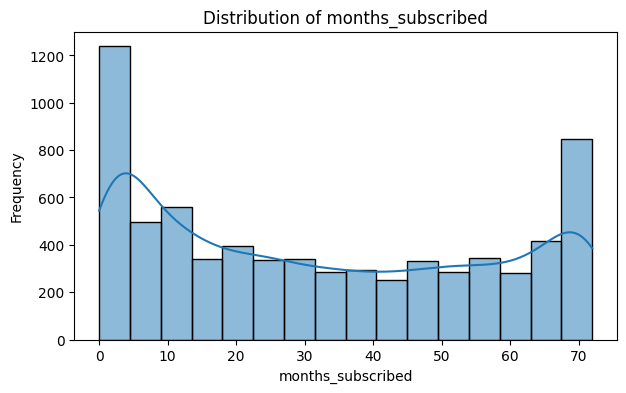

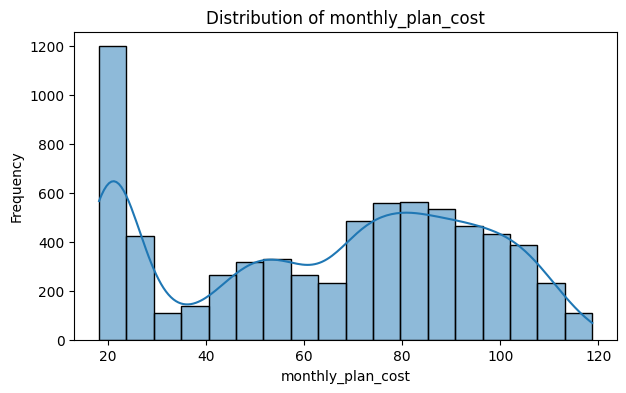

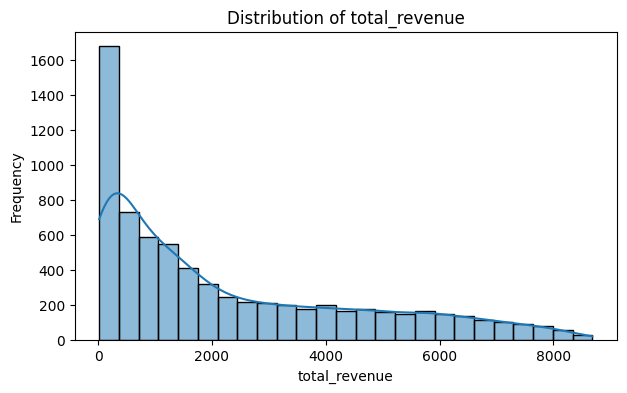

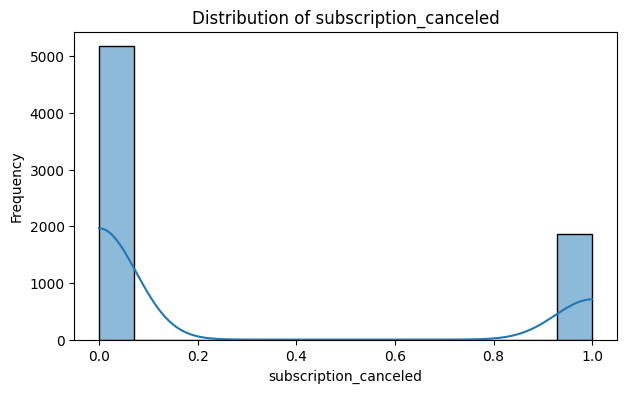

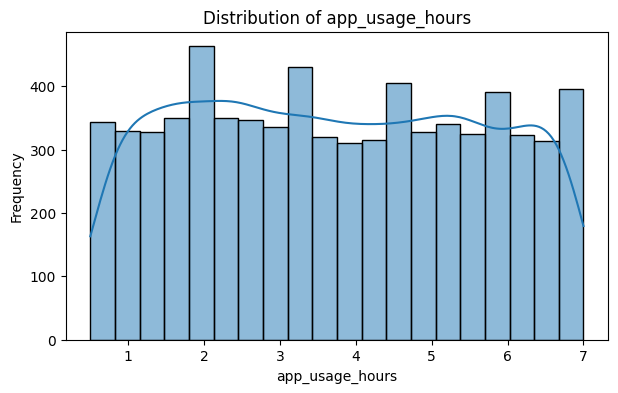

...

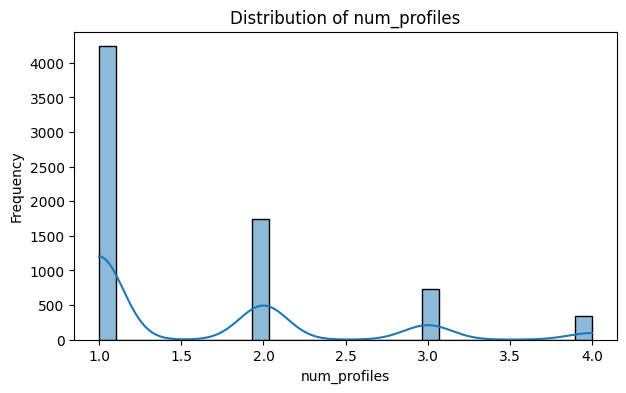

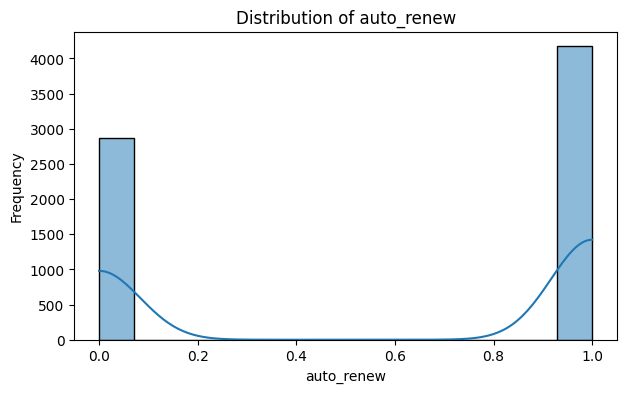

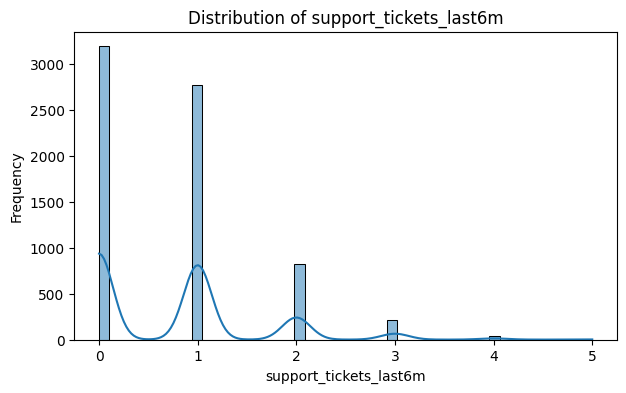

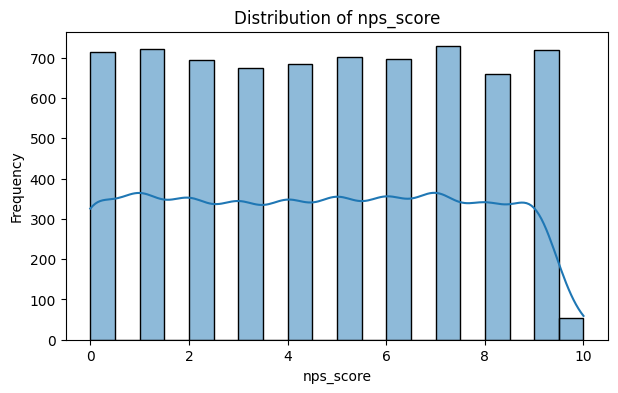

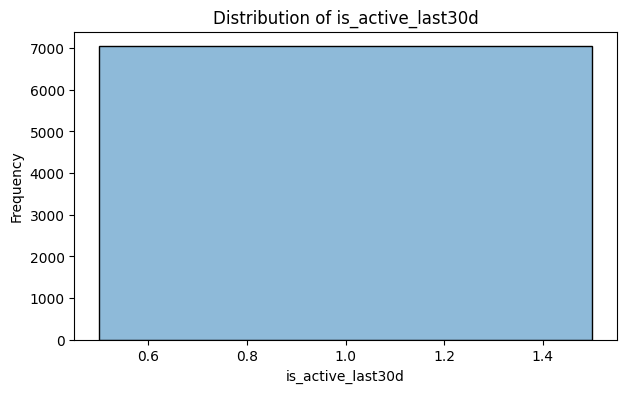


Generating Box Plots...


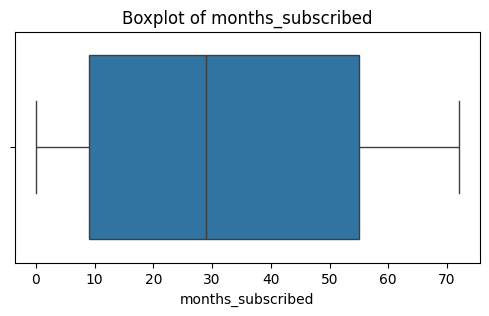

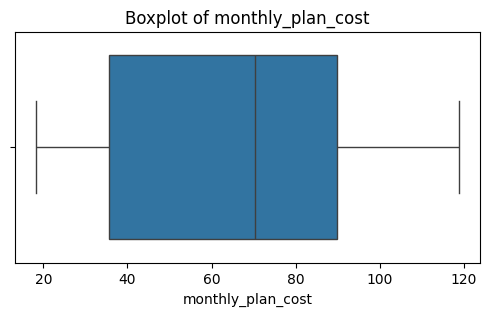

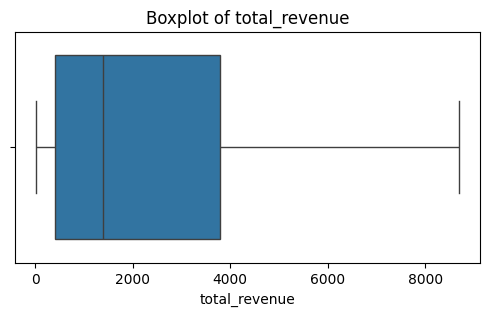

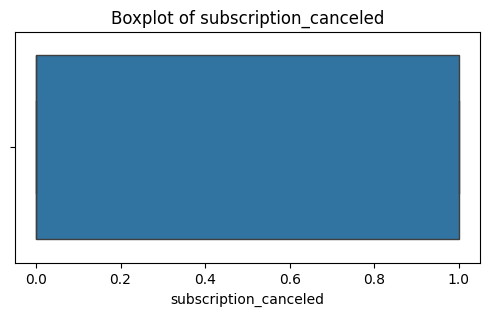

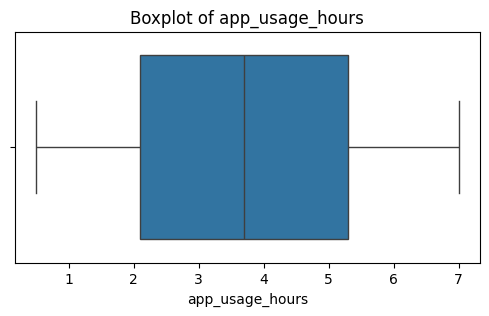

...

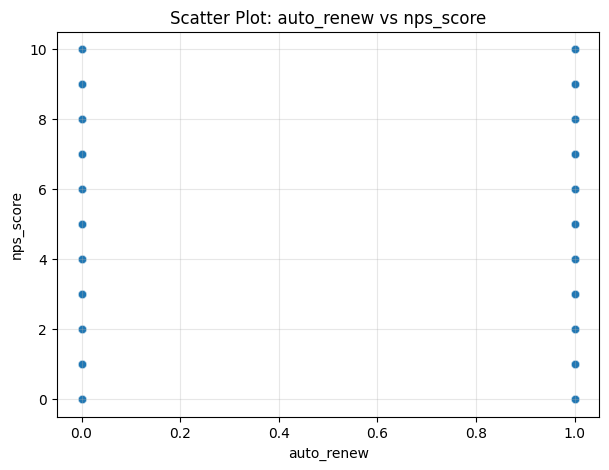

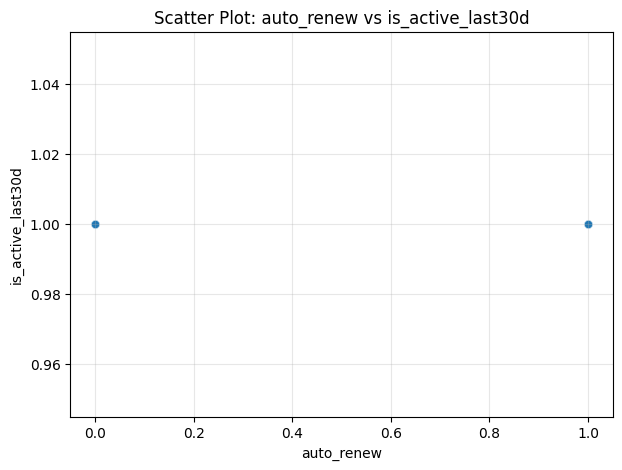

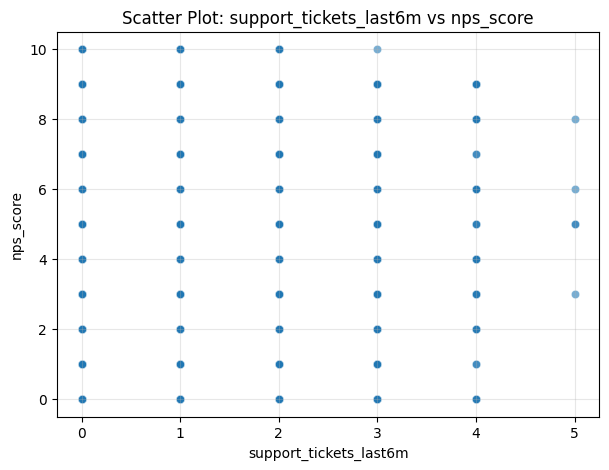

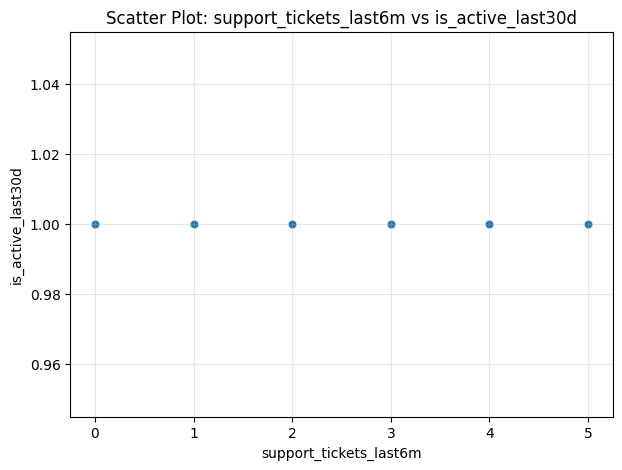

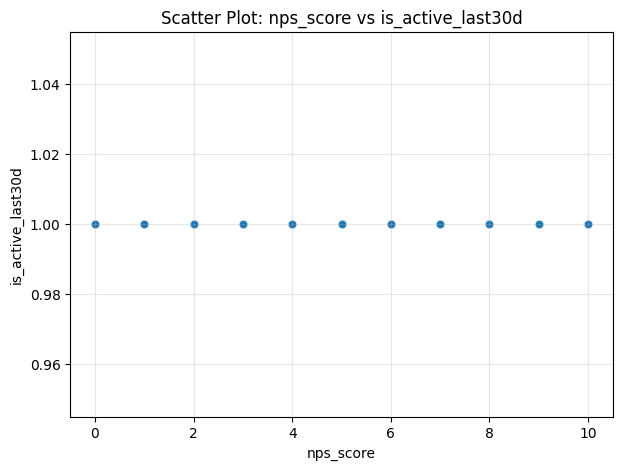


Generating Pairplot (May take time for large datasets)...


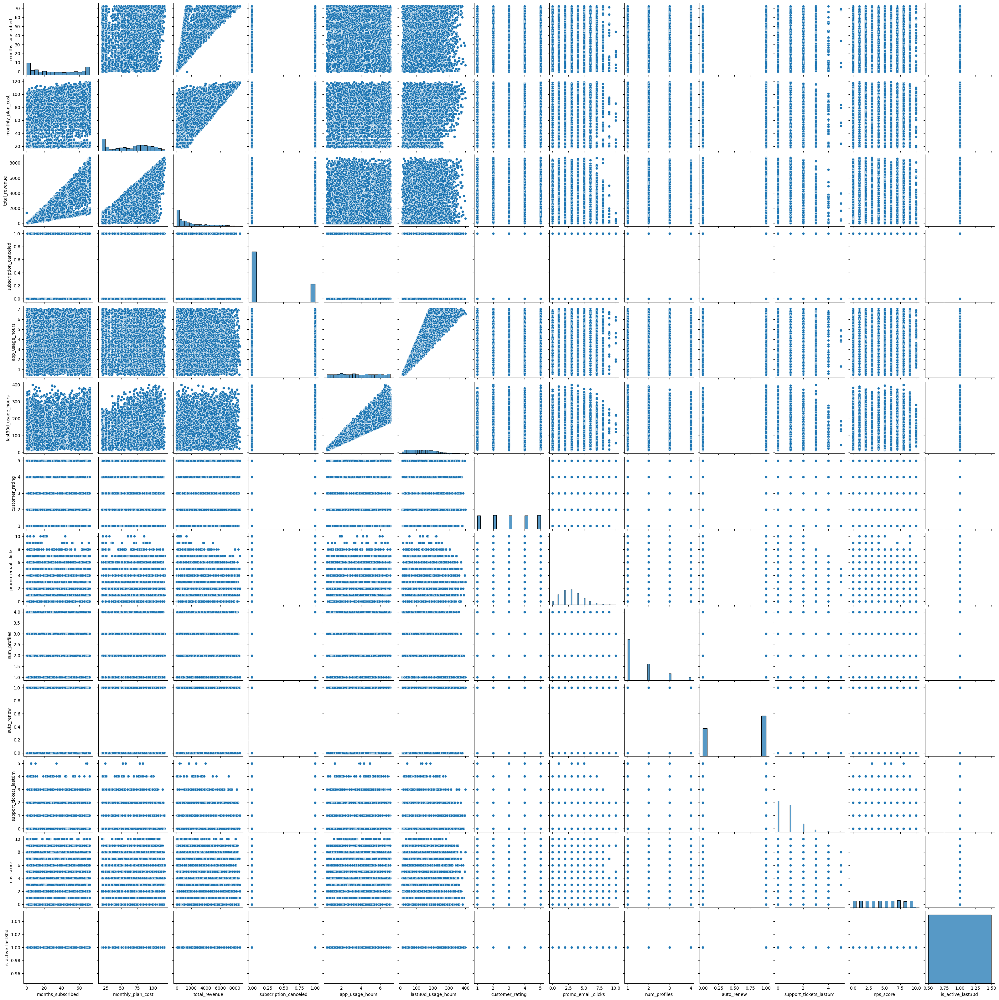


===== Skewness =====
num_profiles              1.325678
support_tickets_last6m    1.153249
subscription_canceled     1.063031
total_revenue             0.963789
promo_email_clicks        0.558352
last30d_usage_hours       0.500657
months_subscribed         0.239540
app_usage_hours           0.042785
nps_score                 0.008629
is_active_last30d         0.000000
customer_rating          -0.003374
monthly_plan_cost        -0.220524
auto_renew               -0.375396
dtype: float64

===== Kurtosis =====
support_tickets_last6m    1.452515
num_profiles              0.838651
promo_email_clicks        0.233390
is_active_last30d         0.000000
total_revenue            -0.226400
last30d_usage_hours      -0.343555
subscription_canceled    -0.870211
app_usage_hours          -1.204069
nps_score                -1.218853
monthly_plan_cost        -1.257260
customer_rating          -1.302833
months_subscribed        -1.387372
auto_renew               -1.859606
dtype: float64

===== Missing V

In [37]:

# # --------------------------------------
# # 1. SUMMARY STATISTICS
# # --------------------------------------
print("\n===== Summary Statistics =====")

display(num_data.describe().T)


# # --------------------------------------
# # 2. DISTRIBUTION PLOTS (Histogram + KDE)
# # --------------------------------------
print("\nGenerating Distribution Plots...")

for col in num_col:
    plt.figure(figsize=(7,4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()


# # --------------------------------------
# # 3. BOX PLOTS (OUTLIER Detection)
# # --------------------------------------
print("\nGenerating Box Plots...")

for col in num_col:
    plt.figure(figsize=(6,3))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.show()


# # --------------------------------------
# # 4. CORRELATION MATRIX (Heatmap)                                                                 - BIVARIATE NUM-NUM ANALYSIS
# # --------------------------------------
corr = num_data.corr()

plt.figure(figsize=(10,6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

# # --------------------------------------
# # 4. Scattered Plot                                                                             - BIVARIATE NUM-NUM ANALYSIS
# # --------------------------------------
num_pairs = []

for i in range(len(num_col)):
    for j in range(i+1, len(num_col)):
        num_pairs.append((num_col[i], num_col[j]))


for x_col, y_col in num_pairs:
    plt.figure(figsize=(7,5))
    sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.6)
    plt.title(f"Scatter Plot: {x_col} vs {y_col}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.grid(True, alpha=0.3)
    plt.show()




# # --------------------------------------
# # 5. Pairplot                                                                                      (Multivariate Visualization)
# # --------------------------------------
print("\nGenerating Pairplot (May take time for large datasets)...")

sns.pairplot(num_data)
plt.show()


# # --------------------------------------
# # 6. Identify Skewness
# # --------------------------------------
print("\n===== Skewness =====")
print(num_data.skew().sort_values(ascending=False))


# # --------------------------------------
# # 7. Identify Kurtosis
# # --------------------------------------
print("\n===== Kurtosis =====")
print(num_data.kurt().sort_values(ascending=False))


# # --------------------------------------
# # 8. Missing Value Count (Optional)
# # --------------------------------------
print("\n===== Missing Value Counts =====")
print(num_data.isnull().sum())


===== Unique Value Counts =====

Column: customer_id
Unique Values (7043): ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

Column: gender
Unique Values (2): ['Female' 'Male']

Column: streaming_quality
Unique Values (3): ['HD' '4K' 'SD']

Column: subscription_type
Unique Values (3): ['Month-to-month' 'One year' 'Two year']

Column: payment_mode
Unique Values (4): ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']

Column: device_type
Unique Values (3): ['Mobile' 'Desktop' 'SmartTV']

===== Frequency Distribution =====

Value Counts for customer_id:
customer_id
7590-VHVEG    1
5575-GNVDE    1
3668-QPYBK    1
7795-CFOCW    1
9237-HQITU    1
             ..
6840-RESVB    1
2234-XADUH    1
4801-JZAZL    1
8361-LTMKD    1
3186-AJIEK    1
Name: count, Length: 7043, dtype: int64

Value Counts for gender:
gender
Male      3555
Female    3488
Name: count, dtype: int64

Value Counts for streaming_quality:
streaming_qu

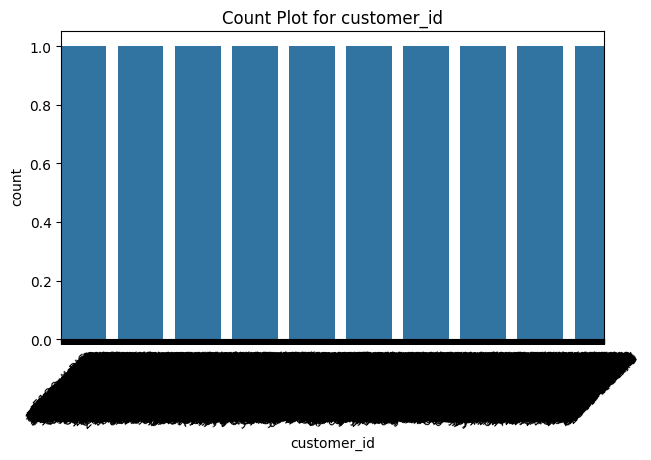

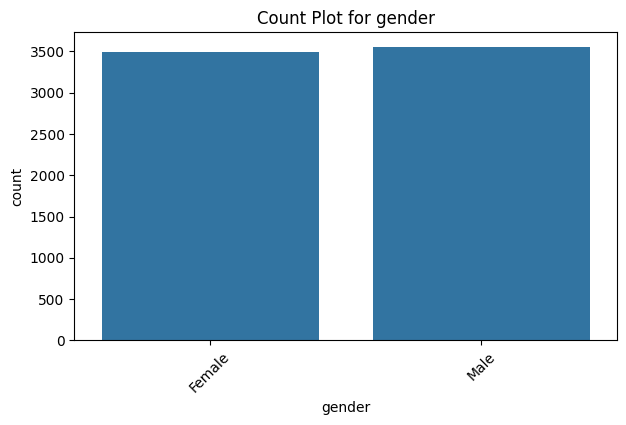

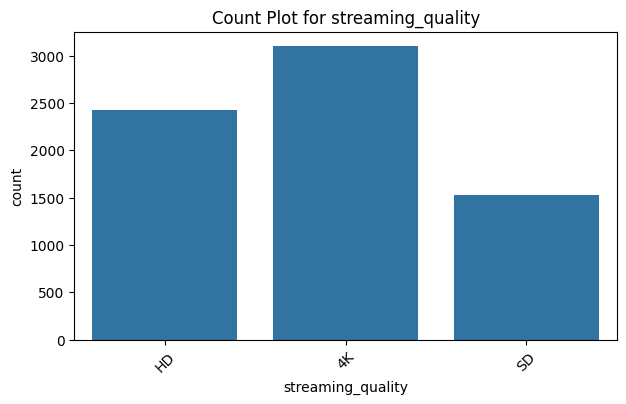

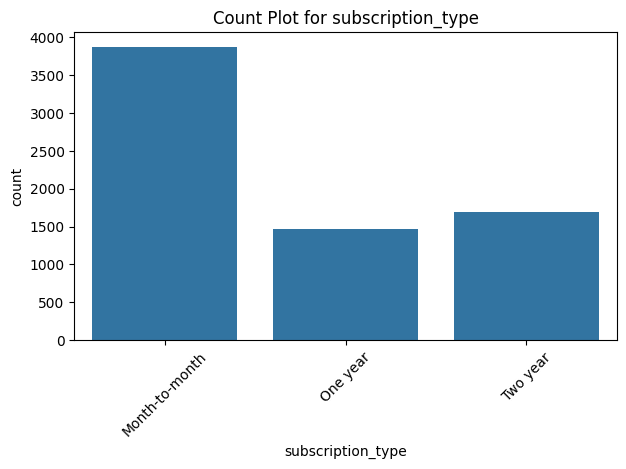

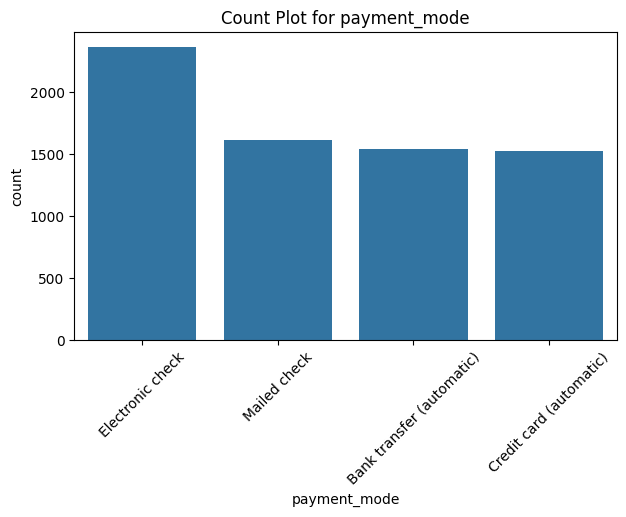

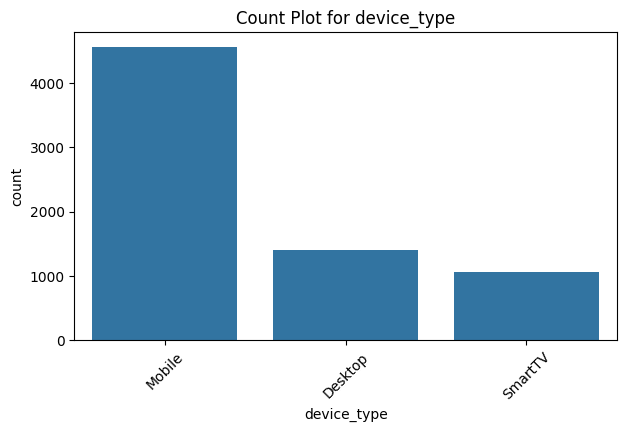


===== Missing Value Counts =====
customer_id          0
gender               0
streaming_quality    0
subscription_type    0
payment_mode         0
device_type          0
dtype: int64

===== Cross-tab with Target (subscription_canceled) =====

Cross-tab for customer_id vs subscription_canceled:
subscription_canceled     0     1   All
customer_id                            
0002-ORFBO                1     0     1
0003-MKNFE                1     0     1
0004-TLHLJ                0     1     1
0011-IGKFF                0     1     1
0013-EXCHZ                0     1     1
...                     ...   ...   ...
9992-RRAMN                0     1     1
9992-UJOEL                1     0     1
9993-LHIEB                1     0     1
9995-HOTOH                1     0     1
All                    5174  1869  7043

[7044 rows x 3 columns]


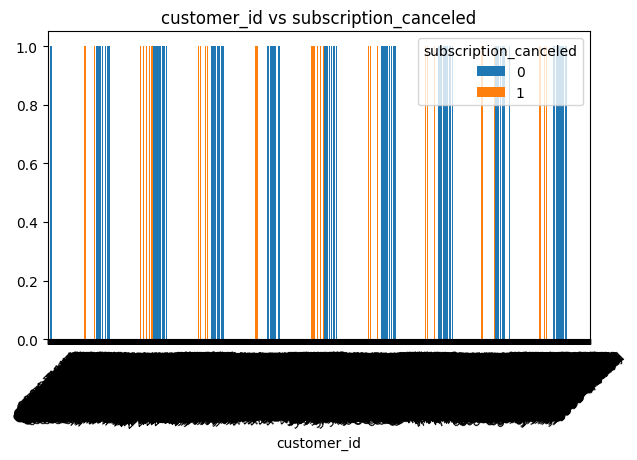


Cross-tab for gender vs subscription_canceled:
subscription_canceled     0     1   All
gender                                 
Female                 2549   939  3488
Male                   2625   930  3555
All                    5174  1869  7043


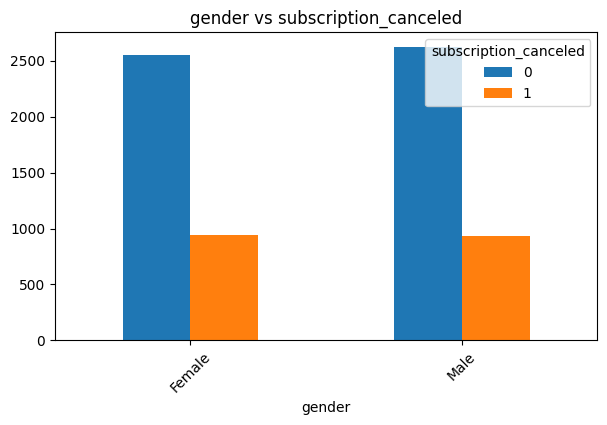


Cross-tab for streaming_quality vs subscription_canceled:
subscription_canceled     0     1   All
streaming_quality                      
4K                     1799  1297  3096
HD                     1962   459  2421
SD                     1413   113  1526
All                    5174  1869  7043


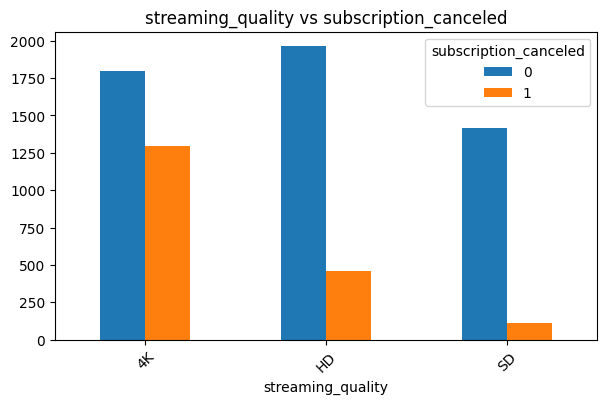


Cross-tab for subscription_type vs subscription_canceled:
subscription_canceled     0     1   All
subscription_type                      
Month-to-month         2220  1655  3875
One year               1307   166  1473
Two year               1647    48  1695
All                    5174  1869  7043


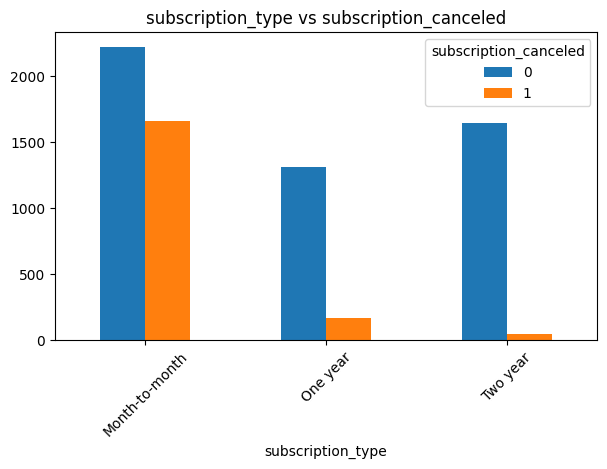


Cross-tab for payment_mode vs subscription_canceled:
subscription_canceled         0     1   All
payment_mode                               
Bank transfer (automatic)  1286   258  1544
Credit card (automatic)    1290   232  1522
Electronic check           1294  1071  2365
Mailed check               1304   308  1612
All                        5174  1869  7043


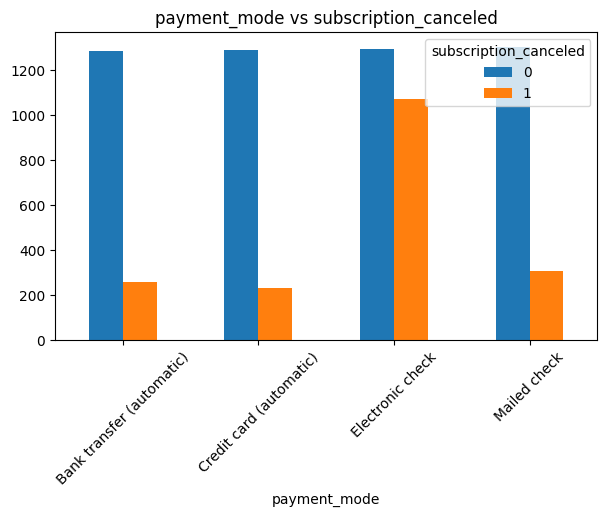


Cross-tab for device_type vs subscription_canceled:
subscription_canceled     0     1   All
device_type                            
Desktop                1016   392  1408
Mobile                 3371  1196  4567
SmartTV                 787   281  1068
All                    5174  1869  7043


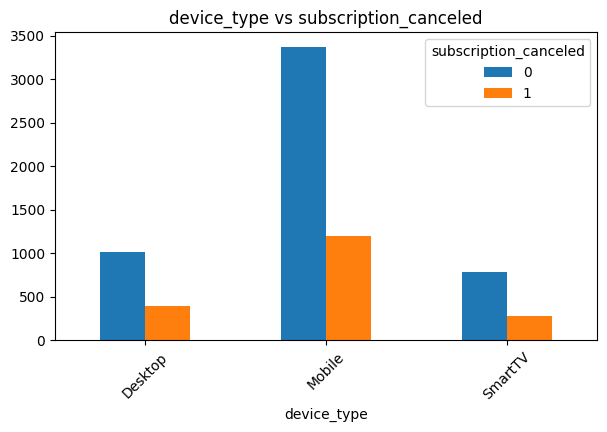


===== Chi-Square Test Results =====

Column: customer_id
Chi-square: 7043.0000,  p-value: 0.494398,  DOF: 7042
❌ No significant association

Column: gender
Chi-square: 0.4841,  p-value: 0.486579,  DOF: 1
❌ No significant association

Column: streaming_quality
Chi-square: 732.3096,  p-value: 0.000000,  DOF: 2
👉 Significant association with target

Column: subscription_type
Chi-square: 1184.5966,  p-value: 0.000000,  DOF: 2
👉 Significant association with target

Column: payment_mode
Chi-square: 648.1423,  p-value: 0.000000,  DOF: 3
👉 Significant association with target

Column: device_type
Chi-square: 1.5415,  p-value: 0.462664,  DOF: 2
❌ No significant association


In [41]:

# --------------------------------------
# 1. UNIQUE COUNTS
# --------------------------------------
print("\n===== Unique Value Counts =====")
for col in cat_col:
    print(f"\nColumn: {col}")
    print(f"Unique Values ({cat_data[col].nunique()}): {cat_data[col].unique()}")


# --------------------------------------
# 2. FREQUENCY DISTRIBUTION
# --------------------------------------
print("\n===== Frequency Distribution =====")
for col in cat_col:
    print(f"\nValue Counts for {col}:")
    print(cat_data[col].value_counts())



# --------------------------------------
# 3. BAR PLOTS for Categorical Variables
# --------------------------------------
print("\nGenerating Bar Plots...")

for col in cat_col:
    plt.figure(figsize=(7,4))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f"Count Plot for {col}")
    plt.show()


# --------------------------------------
# 4. Missing Values in Categorical Variables
# --------------------------------------
print("\n===== Missing Value Counts =====")
print(cat_data.isnull().sum())


# --------------------------------------
# 5. Cross-tab with Target Variable (if exists)                                            - cat-cat BIVARIATE ANALYSIS
# --------------------------------------
target = "subscription_canceled"
if target:
    print(f"\n===== Cross-tab with Target ({target}) =====")
    for col in cat_col:
        print(f"\nCross-tab for {col} vs {target}:")
        ct = pd.crosstab(df[col], df[target], margins=True)
        print(ct)

        # Plot
        ct2 = pd.crosstab(df[col], df[target])
        ct2.plot(kind='bar', figsize=(7,4))
        plt.title(f"{col} vs {target}")
        plt.xticks(rotation=45)
        plt.show()


# --------------------------------------
# 6. Chi-Square Test (Categorical Association)                                               - cat-cat BIVARIATE ANALYSIS
# --------------------------------------
if target:
    print("\n===== Chi-Square Test Results =====")

    for col in cat_col:
        if col != target:
            table = pd.crosstab(df[col], df[target])
            chi2, p, dof, _ = chi2_contingency(table)

            print(f"\nColumn: {col}")
            print(f"Chi-square: {chi2:.4f},  p-value: {p:.6f},  DOF: {dof}")

            if p < 0.05:
                print("👉 Significant association with target")
            else:
                print("❌ No significant association")

===== T-TEST RESULTS (only for binary categorical columns) =====

months_subscribed ~ gender
T-statistic: -0.4285,  p-value: 0.668297

monthly_plan_cost ~ gender
T-statistic: 1.2227,  p-value: 0.221494

total_revenue ~ gender
T-statistic: 0.0002,  p-value: 0.999871

subscription_canceled ~ gender
T-statistic: 0.7226,  p-value: 0.469943

app_usage_hours ~ gender
T-statistic: -0.0906,  p-value: 0.927785

last30d_usage_hours ~ gender
T-statistic: 0.2497,  p-value: 0.802803

customer_rating ~ gender
T-statistic: -0.1894,  p-value: 0.849760

promo_email_clicks ~ gender
T-statistic: 0.8580,  p-value: 0.390926

num_profiles ~ gender
T-statistic: 0.3205,  p-value: 0.748585

auto_renew ~ gender
T-statistic: 0.9864,  p-value: 0.323986

support_tickets_last6m ~ gender
T-statistic: -2.1865,  p-value: 0.028812

nps_score ~ gender
T-statistic: 0.4277,  p-value: 0.668869

is_active_last30d ~ gender
T-statistic: nan,  p-value: nan

===== ANOVA RESULTS (for categorical with 3+ groups) =====


/media/bhati/BHATI/PROJECT/SubsRTN_Analytics/.venv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/media/bhati/BHATI/PROJECT/SubsRTN_Analytics/.venv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: SmallSampleWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if is_too_small(samples, kwds):
/tmp/ipykernel_104557/3934673504.py:34: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  f_stat, p_val = f_oneway(*groups)



months_subscribed ~ customer_id
F-statistic: nan,  p-value: nan

monthly_plan_cost ~ customer_id
F-statistic: nan,  p-value: nan

total_revenue ~ customer_id
F-statistic: nan,  p-value: nan

subscription_canceled ~ customer_id
F-statistic: nan,  p-value: nan

app_usage_hours ~ customer_id
F-statistic: nan,  p-value: nan

last30d_usage_hours ~ customer_id
F-statistic: nan,  p-value: nan

customer_rating ~ customer_id
F-statistic: nan,  p-value: nan

promo_email_clicks ~ customer_id
F-statistic: nan,  p-value: nan

num_profiles ~ customer_id
F-statistic: nan,  p-value: nan

auto_renew ~ customer_id
F-statistic: nan,  p-value: nan

support_tickets_last6m ~ customer_id
F-statistic: nan,  p-value: nan

nps_score ~ customer_id
F-statistic: nan,  p-value: nan

is_active_last30d ~ customer_id
F-statistic: nan,  p-value: nan

months_subscribed ~ streaming_quality
F-statistic: 5.3897,  p-value: 0.004582

monthly_plan_cost ~ streaming_quality
F-statistic: 16111.6463,  p-value: 0.000000

total_re

/media/bhati/BHATI/PROJECT/SubsRTN_Analytics/.venv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)



auto_renew ~ subscription_type
F-statistic: 114.7033,  p-value: 0.000000

support_tickets_last6m ~ subscription_type
F-statistic: 8.7628,  p-value: 0.000158

nps_score ~ subscription_type
F-statistic: 1.4235,  p-value: 0.240950

is_active_last30d ~ subscription_type
F-statistic: nan,  p-value: nan

months_subscribed ~ payment_mode
F-statistic: 446.4669,  p-value: 0.000000

monthly_plan_cost ~ payment_mode
F-statistic: 450.3190,  p-value: 0.000000

total_revenue ~ payment_mode
F-statistic: 327.8823,  p-value: 0.000000

subscription_canceled ~ payment_mode
F-statistic: 237.8095,  p-value: 0.000000

app_usage_hours ~ payment_mode
F-statistic: 0.5348,  p-value: 0.658414

last30d_usage_hours ~ payment_mode
F-statistic: 23.4641,  p-value: 0.000000

customer_rating ~ payment_mode
F-statistic: 0.3258,  p-value: 0.806723

promo_email_clicks ~ payment_mode
F-statistic: 0.2814,  p-value: 0.838885

num_profiles ~ payment_mode
F-statistic: 0.1320,  p-value: 0.941080

auto_renew ~ payment_mode
F-st

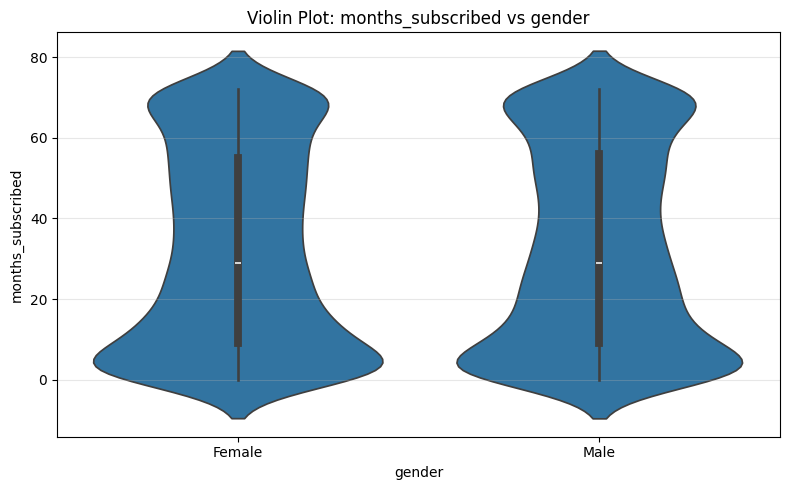

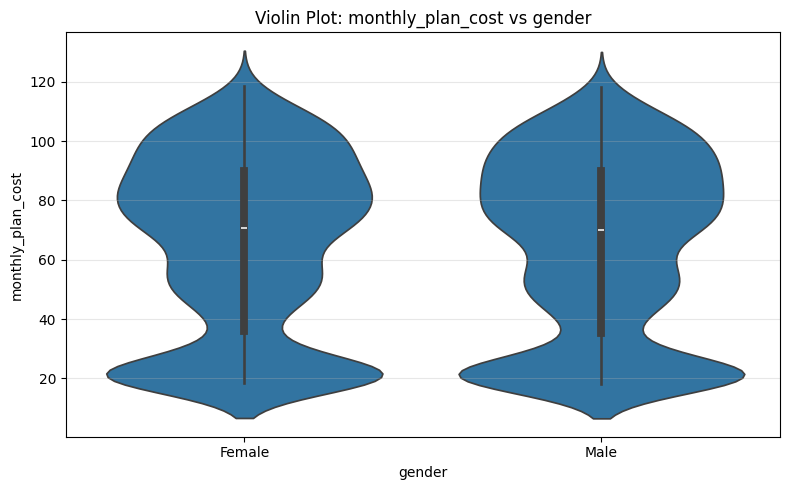

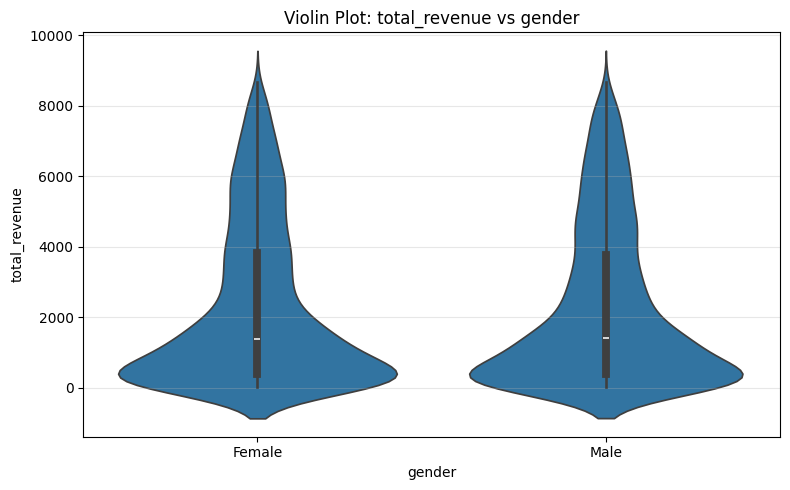

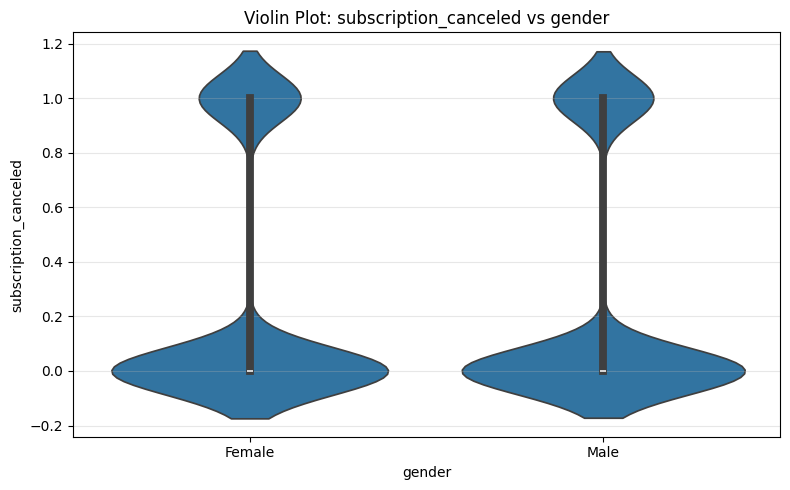

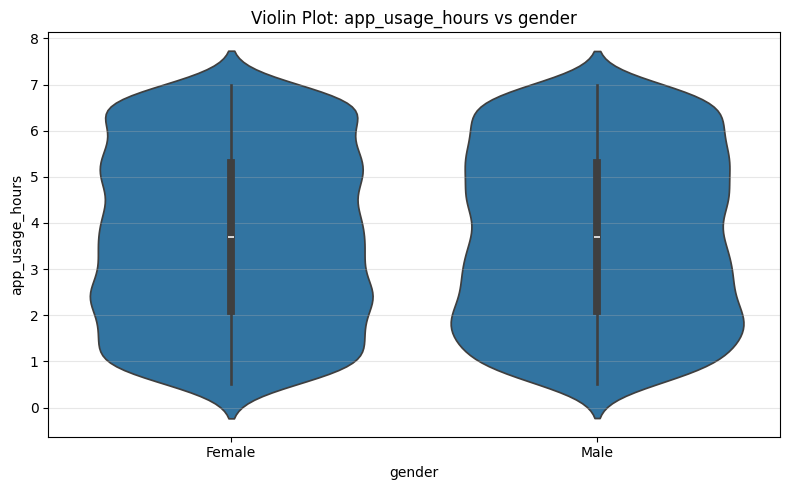

...

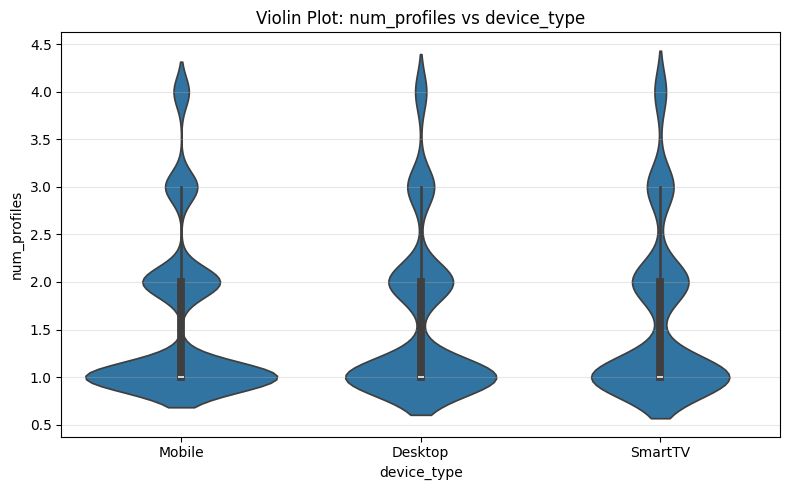

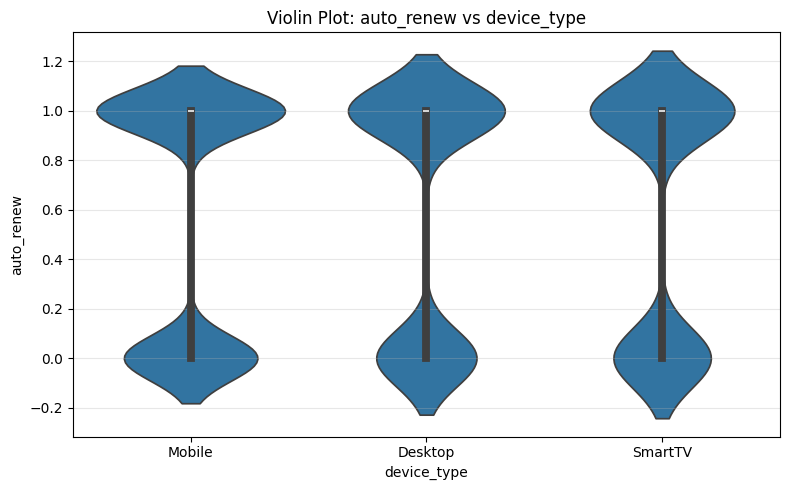

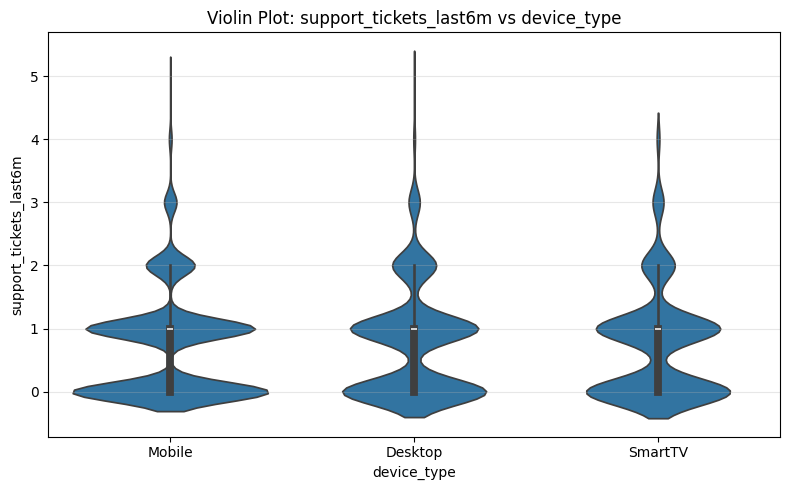

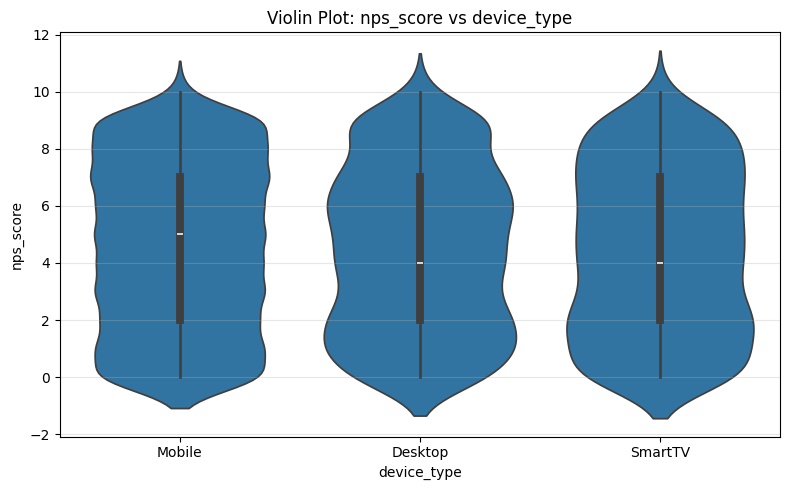

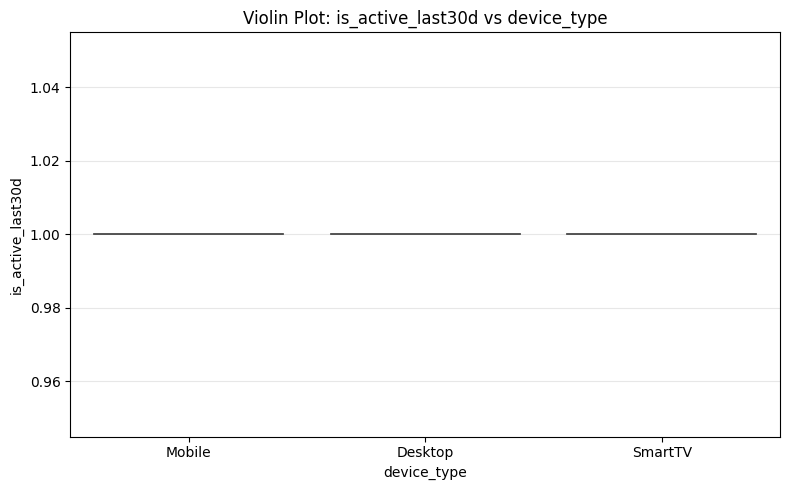


===== BOX PLOTS =====


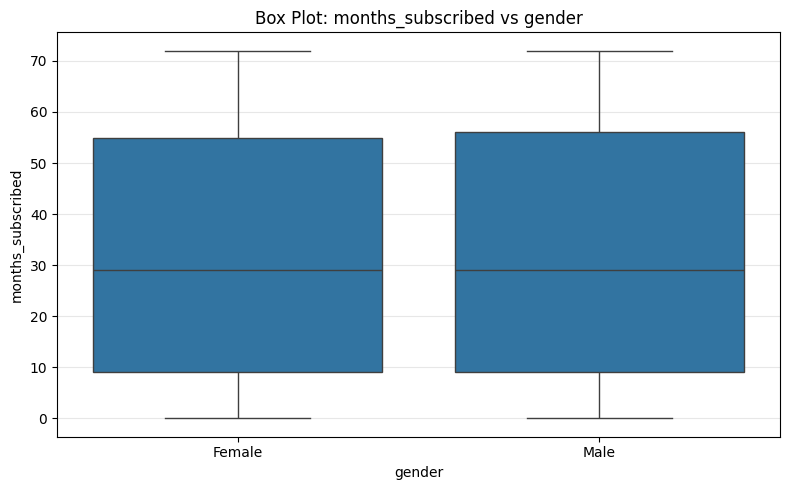

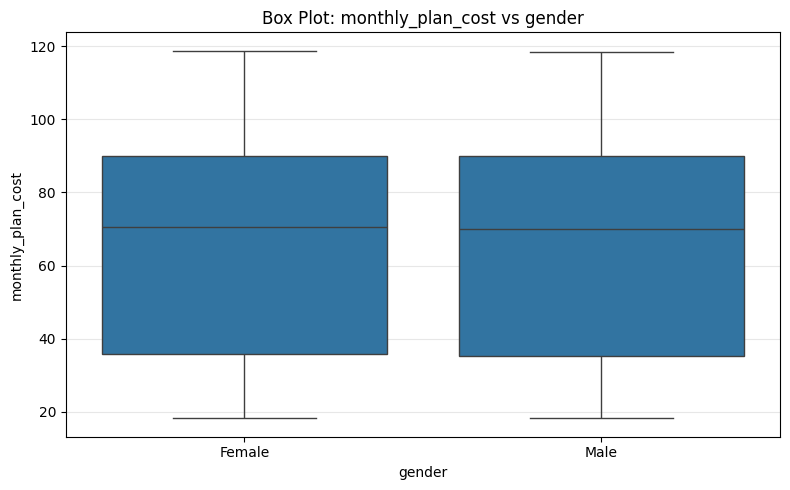

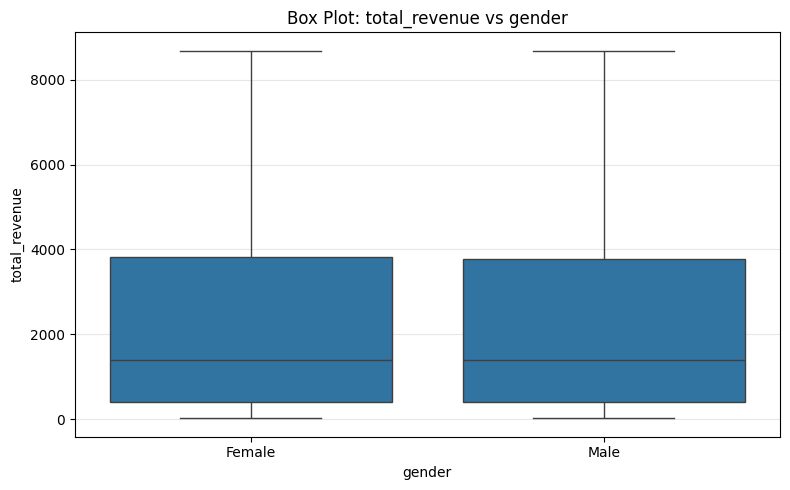

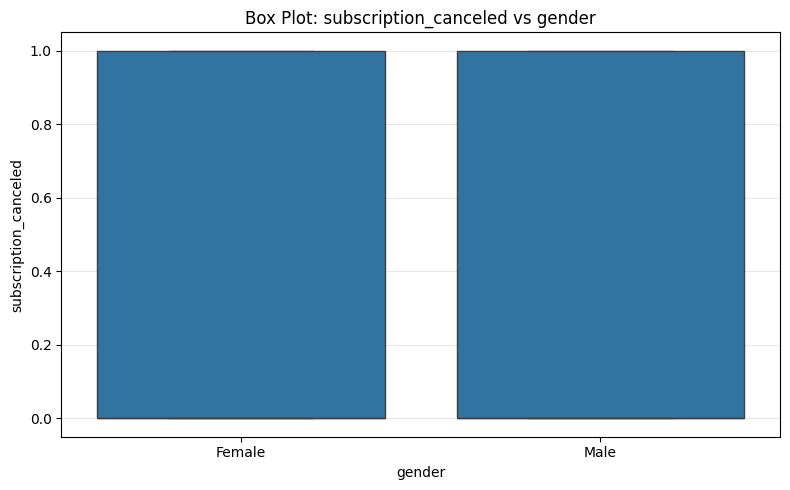

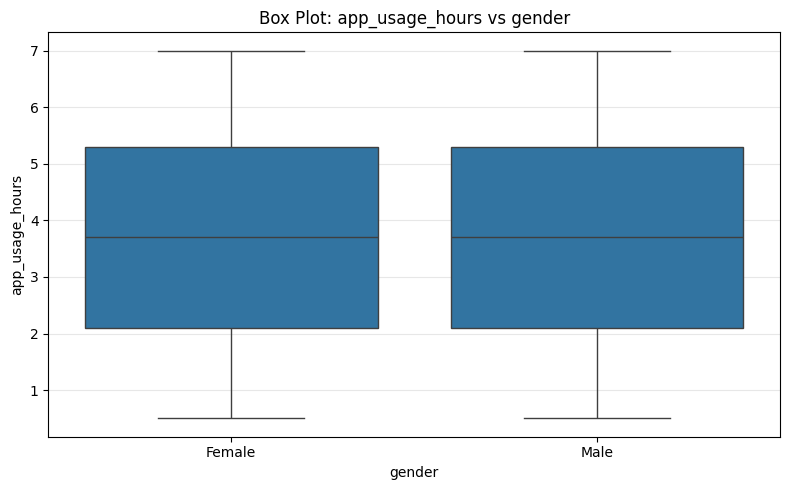

...

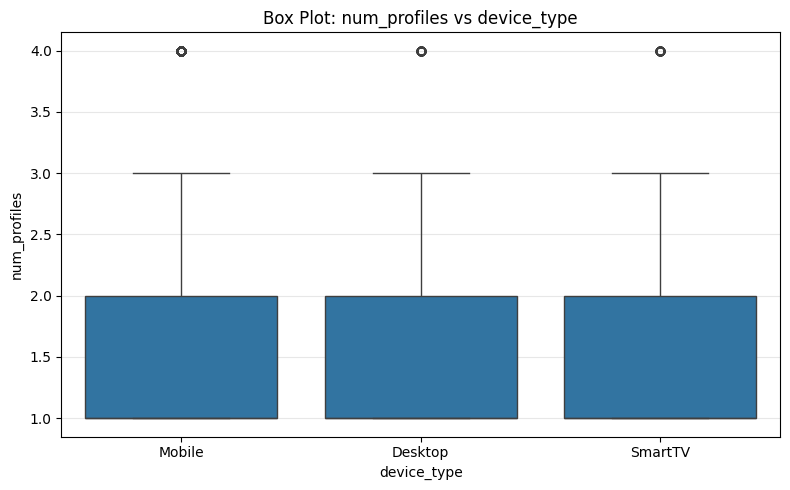

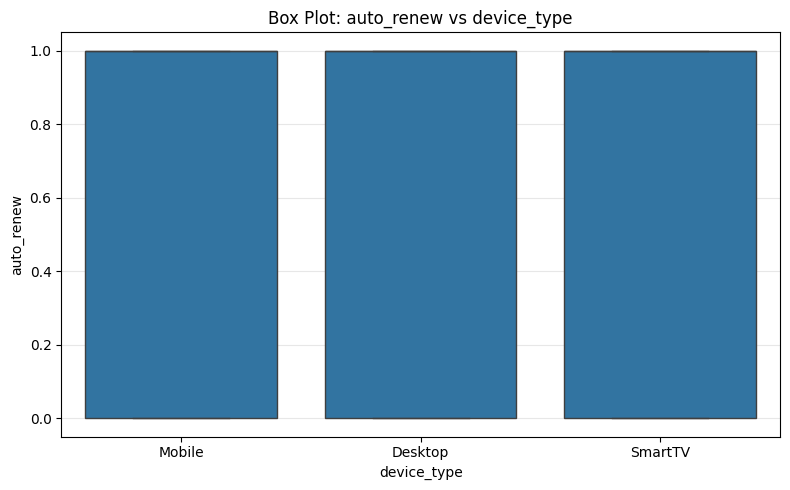

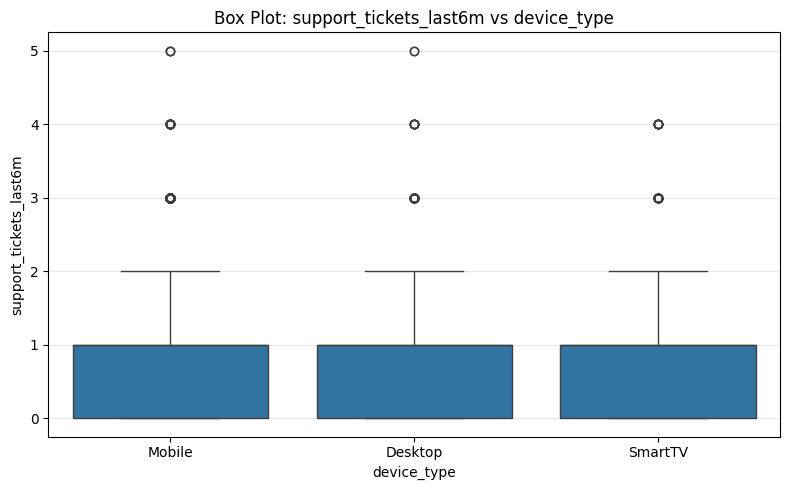

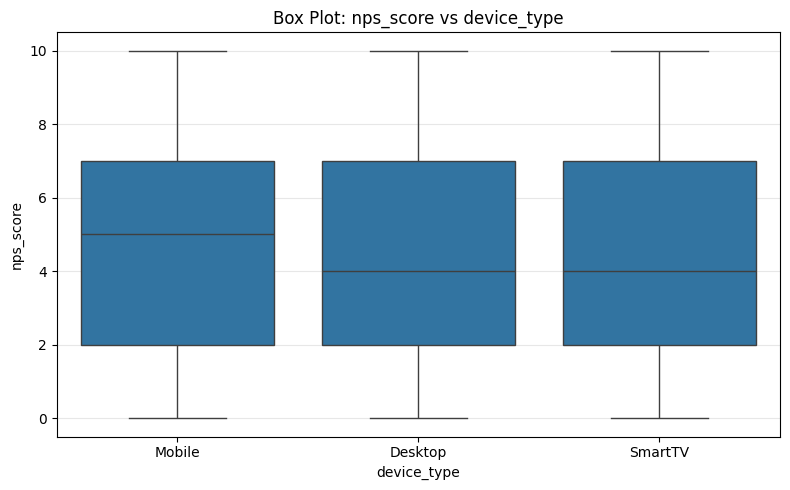

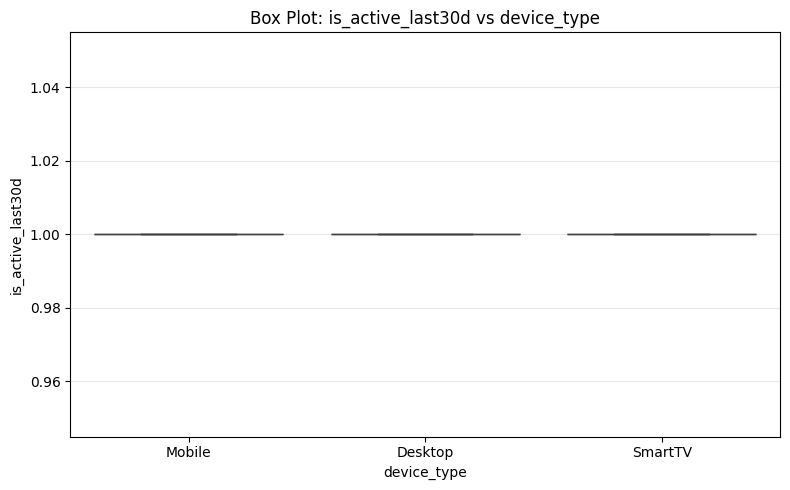

In [45]:
# BIVARIATE ANALYSIS (NUM_CAT)
# ============================================================
# 1. T-TEST → categorical (2 groups) vs numerical
# ============================================================
print("===== T-TEST RESULTS (only for binary categorical columns) =====")

for cat in cat_col:
    if df[cat].nunique() == 2:     # Only binary category
        for num in num_col:
            group1, group2 = df[cat].unique()
            
            # Split numerical column into two groups
            g1 = df[df[cat] == group1][num].dropna()
            g2 = df[df[cat] == group2][num].dropna()

            t_stat, p_val = ttest_ind(g1, g2, equal_var=False)

            print(f"\n{num} ~ {cat}")
            print(f"T-statistic: {t_stat:.4f},  p-value: {p_val:.6f}")



# ============================================================
# 2. ANOVA → categorical (3+ groups) vs numerical
# ============================================================
print("\n===== ANOVA RESULTS (for categorical with 3+ groups) =====")

for cat in cat_col:
    if df[cat].nunique() >= 3:     # 3 or more groups
        for num in num_col:
            groups = [df[df[cat] == val][num].dropna() 
                      for val in df[cat].unique()]

            f_stat, p_val = f_oneway(*groups)

            print(f"\n{num} ~ {cat}")
            print(f"F-statistic: {f_stat:.4f},  p-value: {p_val:.6f}")



# ============================================================
# 3. VIOLIN PLOT → numerical vs categorical
# ============================================================
print("\n===== VIOLIN PLOTS =====")

for cat in cat_col:
    if df[cat].nunique() <= 10:   # avoid too many categories
        for num in num_col:
            plt.figure(figsize=(8,5))
            sns.violinplot(data=df, x=cat, y=num)
            plt.title(f"Violin Plot: {num} vs {cat}")
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()





# ============================================================
# 4. BOX PLOT → numerical vs categorical
# ============================================================
print("\n===== BOX PLOTS =====")

for cat in cat_col:
    if df[cat].nunique() <= 10:
        for num in num_col:
            plt.figure(figsize=(8,5))
            sns.boxplot(data=df, x=cat, y=num)
            plt.title(f"Box Plot: {num} vs {cat}")
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()

In [8]:
#EDA REPORT:

"""
generate_eda_report.py
Run: python generate_eda_report.py
Produces: figures/ (images) and EDA_report.md

Dependencies:
    pip install pandas numpy matplotlib seaborn scipy scikit-learn openpyxl
"""

import os
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder


# --------- User settings ---------
INPUT_FILE = '../data/processed/cleaned_subscriptions_churn.csv'
from pathlib import Path

FIG_DIR = Path("../reports/EDA_outputs")
FIG_DIR.mkdir(parents=True, exist_ok=True)

REPORT_FILE = Path("EDA_report.md")
NUMERIC_AS_CAT_UNIQUE_THRESHOLD = 10  # if numeric col has <= this many uniques => treat as categorical-like
RANDOM_SAMPLE_FOR_PAIRPLOT = 1000  # if dataset very large, sample for pairplot
# ---------------------------------



# helper: save figure with consistent dpi
def savefig(fname):
    path = FIG_DIR / fname
    plt.savefig(path, dpi=150)
    plt.close()
    return path

# Load data
df = pd.read_csv(INPUT_FILE)
n_rows, n_cols = df.shape

# Detect numeric and categorical columns
df=df.drop("customer_id",axis=1)
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
non_numeric = df.select_dtypes(exclude=[np.number]).columns.tolist()

# Consider numeric-but-categorical (low unique)
numeric_but_cat = [c for c in numeric_cols if df[c].nunique(dropna=False) <= NUMERIC_AS_CAT_UNIQUE_THRESHOLD]
# final categorical includes non-numeric + numeric_but_cat
categorical_cols = sorted(list(set(non_numeric + numeric_but_cat)))
# true numeric for continuous analysis
true_numeric_cols = [c for c in numeric_cols if c not in numeric_but_cat]

# If user provided specific lists, they can override here.
print(f"Rows: {n_rows}, Cols: {n_cols}")
print("Detected numeric cols:", true_numeric_cols)
print("Detected categorical cols:", categorical_cols)

# Basic report container (we'll append markdown lines)
md = []
md.append(f"# EDA Report\n\nDataset: `{INPUT_FILE}`  \nRows: **{n_rows}**, Columns: **{n_cols}**\n")

# Section: Column summary
md.append("## Column summary\n")
md.append("| Column | Type | Non-null | Unique | Example values |\n|---|---:|---:|---:|---|\n")
for col in df.columns:
    dtype = str(df[col].dtype)
    non_null = df[col].count()
    unique = df[col].nunique(dropna=False)
    sample_vals = ", ".join(map(str, df[col].dropna().unique()[:5]))
    md.append(f"| `{col}` | {dtype} | {non_null} | {unique} | {sample_vals} |\n")

# -------------------------
# 1. NUMERICAL ANALYSIS (items 1-8 from your list)
# -------------------------
md.append("\n## Numerical analysis (continuous / numeric columns)\n")
if true_numeric_cols:
    ## 1. Summary stats
    md.append("### 1 — Summary statistics\n")
    desc = df[true_numeric_cols].describe().T
    desc["skewness"] = df[true_numeric_cols].skew()
    desc["kurtosis"] = df[true_numeric_cols].kurtosis()
    md.append("Summary table (count, mean, std, min, 25%, 50%, 75%, max, skewness, kurtosis):\n\n")
    md.append(desc.to_markdown() + "\n\n")

    ## 2. Histogram + KDE
    md.append("### 2 — Histogram + KDE (saved images)\n")
    for col in true_numeric_cols:
        plt.figure(figsize=(6,4))
        sns.histplot(df[col].dropna(), kde=True, stat='density')
        plt.title(f"Histogram + KDE: {col}")
        fname = savefig(f"hist_kde_{col}.png").name
        md.append(f"![Histogram KDE {col}](figures/{fname})  \n")

    ## 3. Box plots
    md.append("\n### 3 — Box plots (saved images)\n")
    for col in true_numeric_cols:
        plt.figure(figsize=(6,2.5))
        sns.boxplot(x=df[col].dropna())
        plt.title(f"Boxplot: {col}")
        fname = savefig(f"box_{col}.png").name
        md.append(f"![Boxplot {col}](figures/{fname})  \n")

    ## 4. Correlation matrix / Heatmap
    md.append("\n### 4 — Correlation matrix and heatmap\n")
    corr = df[true_numeric_cols].corr(method='pearson')
    md.append("Pearson correlation matrix:\n\n")
    md.append(corr.round(3).to_markdown() + "\n\n")
    plt.figure(figsize=(max(6, len(true_numeric_cols)/2), max(4, len(true_numeric_cols)/3)))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="vlag", center=0)
    fname = savefig("corr_heatmap.png").name
    md.append(f"![Correlation heatmap](figures/{fname})  \n")

    ## 5. Scatter plots (pairwise scatter)
    md.append("\n### 5 — Scatter plots (pairwise) — sample pairplot\n")
    sample = df[true_numeric_cols].dropna()
    if len(sample) > RANDOM_SAMPLE_FOR_PAIRPLOT:
        sample = sample.sample(RANDOM_SAMPLE_FOR_PAIRPLOT, random_state=42)
    pairplot_path = FIG_DIR / "pairplot.png"
    # Use seaborn pairplot but save differently: draw and save
    sns_plot = sns.pairplot(sample)
    sns_plot.fig.suptitle("Pairplot (sampled)", y=1.02)
    sns_plot.fig.savefig(pairplot_path, dpi=150)
    plt.close('all')
    md.append(f"![Pairplot sample](figures/{pairplot_path.name})  \n")

    ## 6. Pair plot note already included above
    md.append("\n### 6 — Pair plot\nPairplot (sample used for performance) above.\n")

    ## 7 & 8 Skewness and Kurtosis values (already included in summary above)
    md.append("\n### 7 — Skewness and 8 — Kurtosis\nSkewness and kurtosis were added to the summary table above.\n")

    # Outlier detection summary (IQR & z-score & percentile)
    md.append("\n### Outlier detection (per numeric column)\n")
    outlier_summary = []
    for col in true_numeric_cols:
        s = df[col].dropna()
        if s.empty:
            continue
        q1 = s.quantile(0.25)
        q3 = s.quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5*iqr
        upper = q3 + 1.5*iqr
        iqr_out = ((s < lower) | (s > upper)).sum()
        # z-score method
        z = np.abs(stats.zscore(s))
        z_out = (z > 3).sum()
        # percentile method for skewed: outside 1st-99th
        p_out = ((s < s.quantile(0.01)) | (s > s.quantile(0.99))).sum()
        outlier_summary.append((col, len(s), iqr_out, z_out, p_out))
    out_df = pd.DataFrame(outlier_summary, columns=["column","n_nonnull","iqr_outliers","z_outliers","pct1_99_outliers"])
    md.append("Outlier counts by methods (IQR / Z>3 / outside 1%–99%):\n\n")
    md.append(out_df.to_markdown(index=False) + "\n\n")

else:
    md.append("No numeric (continuous) columns detected.\n")

# -------------------------
# 2. CATEGORICAL ANALYSIS (items 9-14)
# -------------------------
md.append("\n## Categorical analysis\n")
if categorical_cols:
    for col in categorical_cols:
        md.append(f"### Column: `{col}`\n")
        vc = df[col].value_counts(dropna=False)
        md.append("Value counts (including NaN):\n\n")
        md.append(vc.to_frame(name="count").to_markdown() + "\n\n")

        # frequency distribution bar plot
        plt.figure(figsize=(6,3))
        sns.barplot(x=vc.index.astype(str), y=vc.values)
        plt.xticks(rotation=45, ha='right')
        plt.title(f"Bar plot: {col}")
        fname = savefig(f"bar_{col}.png").name
        md.append(f"![Bar {col}](figures/{fname})  \n")

    # Cross tab & Chi-square: for pairs of categorical columns
    md.append("\n### Cross tab & Chi-square tests (categorical vs categorical)\n")
    for i, c1 in enumerate(categorical_cols):
        for c2 in categorical_cols[i+1:]:
            # require both have at least 2 unique levels
            if df[c1].nunique(dropna=True) < 2 or df[c2].nunique(dropna=True) < 2:
                continue
            ct = pd.crosstab(df[c1], df[c2])
            md.append(f"#### Cross-tab: `{c1}` x `{c2}`\n")
            md.append(ct.to_markdown() + "\n\n")
            # chi-square
            try:
                chi2, p, dof, exp = stats.chi2_contingency(ct.fillna(0))
                md.append(f"- Chi-square test: chi2={chi2:.3f}, p-value={p:.4g}, dof={dof}\n\n")
            except Exception as e:
                md.append(f"- Chi-square test: failed ({e})\n\n")

    # stacked bar charts for each pair
    md.append("### Stacked bar charts (sample)\n")
    for i, c1 in enumerate(categorical_cols):
        for c2 in categorical_cols[i+1:i+2]:  # just produce one partner per column to avoid huge number
            ct = pd.crosstab(df[c1], df[c2])
            ct.plot(kind='bar', stacked=True, figsize=(6,4))
            plt.title(f"Stacked bar: {c1} x {c2}")
            plt.xticks(rotation=45, ha='right')
            fname = savefig(f"stacked_{c1}_by_{c2}.png").name
            md.append(f"![Stacked {c1}_by_{c2}](figures/{fname})  \n")
else:
    md.append("No categorical columns detected.\n")

# -------------------------
# BIVARIATE ANALYSIS (items 15-18)
# -------------------------
md.append("\n## Bivariate analysis\n")

# Box plot of numeric by categorical (15)
md.append("\n### 15 — Box plots (numeric grouped by categorical)\n")
for cat in categorical_cols:
    for num in true_numeric_cols:
        # skip if category has too many levels (>20)
        if df[cat].nunique(dropna=True) > 20:
            continue
        plt.figure(figsize=(6,3))
        sns.boxplot(x=df[cat].astype(str), y=df[num])
        plt.xticks(rotation=45, ha='right')
        plt.title(f"Boxplot: {num} by {cat}")
        fname = savefig(f"box_{num}_by_{cat}.png").name
        md.append(f"![Box {num}_by_{cat}](figures/{fname})  \n")

# Violin chart (16)
md.append("\n### 16 — Violin charts (numeric grouped by categorical)\n")
for cat in categorical_cols:
    for num in true_numeric_cols:
        if df[cat].nunique(dropna=True) > 20:
            continue
        plt.figure(figsize=(6,3))
        sns.violinplot(x=df[cat].astype(str), y=df[num])
        plt.xticks(rotation=45, ha='right')
        plt.title(f"Violin: {num} by {cat}")
        fname = savefig(f"violin_{num}_by_{cat}.png").name
        md.append(f"![Violin {num}_by_{cat}](figures/{fname})  \n")

# T-test (17) and ANOVA (18): numeric outcome vs categorical group
md.append("\n### 17 — T-tests (numeric by binary categorical) and 18 — ANOVA (numeric by multi-level categorical)\n")
for cat in categorical_cols:
    levels = df[cat].dropna().unique()
    if len(levels) < 2:
        continue
    for num in true_numeric_cols:
        groups = [df[df[cat] == lvl][num].dropna() for lvl in levels]
        md.append(f"#### {num} by {cat}\n")
        md.append(f"- Levels: {list(map(str, levels))}  \n")
        # For binary -> t-test
        try:
            if len(levels) == 2:
                tstat, pval = stats.ttest_ind(groups[0], groups[1], equal_var=False, nan_policy='omit')
                md.append(f"- Two-sample t-test (Welch): t={tstat:.3f}, p={pval:.4g}\n\n")
            elif len(levels) > 2:
                fstat, pval = stats.f_oneway(*groups)
                md.append(f"- One-way ANOVA: F={fstat:.3f}, p={pval:.4g}\n\n")
        except Exception as e:
            md.append(f"- Test failed: {e}\n\n")

# Additional: numeric-numeric tests: Pearson and Spearman
md.append("\n### Numeric–Numeric associations (Pearson & Spearman)\n")
if len(true_numeric_cols) >= 2:
    pearson = df[true_numeric_cols].corr(method='pearson')
    spearman = df[true_numeric_cols].corr(method='spearman')
    md.append("Pearson correlations:\n\n")
    md.append(pearson.round(3).to_markdown() + "\n\n")
    md.append("Spearman correlations:\n\n")
    md.append(spearman.round(3).to_markdown() + "\n\n")

# Save markdown
REPORT_FILE.write_text("\n".join(md), encoding="utf-8")
print(f"Report written to {REPORT_FILE}")
print(f"Figures written to {FIG_DIR} (total: {len(list(FIG_DIR.iterdir()))})")

Rows: 7043, Cols: 19
Detected numeric cols: ['months_subscribed', 'monthly_plan_cost', 'total_revenue', 'app_usage_hours', 'last30d_usage_hours', 'promo_email_clicks', 'nps_score']
Detected categorical cols: ['auto_renew', 'customer_rating', 'device_type', 'gender', 'is_active_last30d', 'num_profiles', 'payment_mode', 'streaming_quality', 'subscription_canceled', 'subscription_type', 'support_tickets_last6m']
Report written to EDA_report.md
Figures written to ../reports/EDA_outputs (total: 191)
